# 03.7b - Sparse excitation (hBN) - plots

Plotting half of `03.7 - sparse excitation hbn - organized sweep.ipynb`. Loads every `.pkl`
written by `03.7a - sparse excitation hbn - generate data.ipynb` from
`sparse_excitation_sweep_results/` and reproduces every figure in the sweep. No GPU, no
`torch`/`quantem` import, nothing here takes longer than a few seconds -- change a colormap,
a disk radius, a grid layout, or the window-size range and just re-run this notebook.

## Setup

In [1]:
import pickle

import numpy as np
from scipy import signal
from matplotlib import pyplot as plt

RESULTS_DIR = "sparse_excitation_sweep_results"

MAIN_SWEEP_DOSE = 1e6   # must match MAIN_SWEEP_DOSE in 03.7a -- which dose's pickles to load


def dose_tag(dose):
    """Compact label for a dose value -- '1e4', '2e3', etc. Falls back to plain %g for values
    that don't reduce to a clean mantissa."""
    exponent = int(np.floor(np.log10(dose) + 1e-9))
    mantissa = dose / 10 ** exponent
    if np.isclose(mantissa, round(mantissa)):
        return f"{round(mantissa)}e{exponent}"
    return f"{dose:g}"


## Context: ground truth

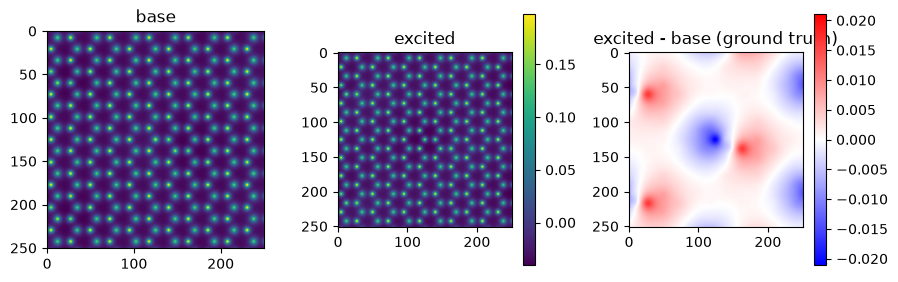

In [2]:
with open('bcenters_base_excited_phases_wide_fov.pkl', 'rb') as f:
    data = pickle.load(f)

base_phase = data['base']
excited_phase = data['excited']
x = data['x']
y = data['y']

plt.figure(figsize=(9, 3))
plt.subplot(1, 3, 1)
plt.imshow(base_phase)
plt.title('base')
plt.subplot(1, 3, 2)
plt.imshow(excited_phase)
plt.title('excited')
plt.colorbar()
plt.subplot(1, 3, 3)
diff_extent = np.max(np.abs(excited_phase - base_phase))
plt.imshow(excited_phase - base_phase, cmap='bwr', vmin=-diff_extent, vmax=diff_extent)
plt.title('excited - base (ground truth)')
plt.colorbar()
plt.tight_layout()
plt.show()

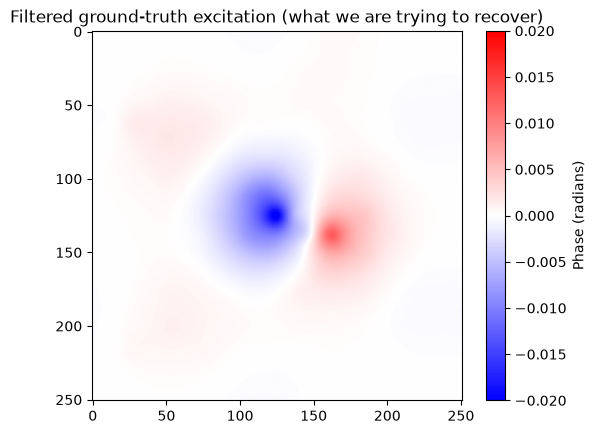

In [3]:
# same Hamming-windowed excitation actually used to drive the simulation in 03.7a
window_y = np.hamming(base_phase.shape[0])
window_x = np.hamming(base_phase.shape[1])
hamming_filter = np.outer(window_y, window_x)

filtered_diff_phase = (excited_phase - base_phase) * hamming_filter

plt.imshow(filtered_diff_phase, cmap='bwr', vmin=-0.02, vmax=0.02)
plt.colorbar(label='Phase (radians)')
plt.title('Filtered ground-truth excitation (what we are trying to recover)')
plt.show()

## Plotting helpers

In [4]:
def disk_kernel(rad):
    ax = np.arange(rad * 2)
    axx, axy = np.meshgrid(ax, ax)
    return ((axy - rad) ** 2 + (axx - rad) ** 2 < rad ** 2).astype(float)


def hot_correlation(diff, rad=7):
    return np.abs(signal.correlate2d(diff, disk_kernel(rad), mode='same'))


def peakiness(hot):
    """How sharply one spot stands out from the rest of the map -- max / mean."""
    return hot.max() / hot.mean()

In [5]:
def plot_regularization_grid(
    results, row_vals, col_vals, row_label, col_label,
    shared_cbar=True, cmap='seismic', suptitle=None,
    cell_size=2.5, dpi=110, savepath=None,
):
    n_rows, n_cols = len(row_vals), len(col_vals)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(cell_size * n_cols + 1.0, cell_size * n_rows + 0.8),
        squeeze=False, dpi=dpi,
    )

    if shared_cbar:
        vmax = max(np.abs(results[(r, c)]).max() for r in row_vals for c in col_vals)

    last_im = None
    for i, r in enumerate(row_vals):
        for j, c in enumerate(col_vals):
            ax = axes[i, j]
            diff = results[(r, c)]
            local_vmax = vmax if shared_cbar else np.abs(diff).max()
            im = ax.imshow(diff, cmap=cmap, vmin=-local_vmax, vmax=local_vmax)
            last_im = im
            ax.set_xticks([])
            ax.set_yticks([])
            if i == 0:
                ax.set_title(f"{c:g}", fontsize=11)
            if j == 0:
                ax.set_ylabel(f"{r:g}", fontsize=11)
            if not shared_cbar:
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    fig.supxlabel(col_label, fontsize=12)
    fig.supylabel(row_label, fontsize=12)

    if shared_cbar:
        fig.colorbar(last_im, ax=axes, fraction=0.025, pad=0.02, label='excitation phase (rad)')

    title = suptitle or f"{row_label} (rows) x {col_label} (cols) -- {'shared' if shared_cbar else 'individual'} colorbar"
    fig.suptitle(title, fontsize=13)

    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig


def plot_block_size_sweep(block_results, block_sizes, weight, savepath=None):
    fig, axes = plt.subplots(1, len(block_sizes), figsize=(3.2 * len(block_sizes), 3.4), dpi=110)
    vmax = max(np.abs(v).max() for v in block_results.values())
    for ax, b in zip(axes, block_sizes):
        ax.imshow(block_results[b], cmap='seismic', vmin=-vmax, vmax=vmax)
        ax.set_title(f"block_size={b}")
        ax.set_xticks([]); ax.set_yticks([])
    fig.suptitle(f"Group sparsity block-size sweep (weight={weight:g}, shared colorbar)")
    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig


def plot_dose_series(entries, rad=7, suptitle=None, savepath=None):
    '''entries: list of (label, diff_image) tuples, one column per dose.'''
    n = len(entries)
    fig, axes = plt.subplots(2, n, figsize=(3.4 * n, 6.6), dpi=110, squeeze=False)
    for j, (label, diff) in enumerate(entries):
        vmax = np.abs(diff).max()
        axes[0, j].imshow(diff, cmap='seismic', vmin=-vmax, vmax=vmax)
        axes[0, j].set_title(label, fontsize=11)
        axes[0, j].set_xticks([]); axes[0, j].set_yticks([])

        hot = hot_correlation(diff, rad=rad)
        axes[1, j].imshow(hot, cmap='hot')
        axes[1, j].set_xticks([]); axes[1, j].set_yticks([])

    if suptitle:
        fig.suptitle(suptitle, fontsize=13)

    axes[0, 0].set_ylabel('recon\n(on - off)', fontsize=10)
    axes[1, 0].set_ylabel(f'disk-corr\n(r={rad}px)', fontsize=10)
    fig.tight_layout(rect=[0, 0, 1, 0.94] if suptitle else None)
    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig


def plot_hot_grid(
    results, row_vals, col_vals, row_label, col_label,
    rad=7, shared_scale=True, suptitle=None,
    cell_size=2.5, dpi=110, savepath=None,
):
    n_rows, n_cols = len(row_vals), len(col_vals)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(cell_size * n_cols + 1.0, cell_size * n_rows + 0.8),
        squeeze=False, dpi=dpi,
    )

    hot_maps = {(r, c): hot_correlation(results[(r, c)], rad=rad) for r in row_vals for c in col_vals}

    if shared_scale:
        vmax = max(h.max() for h in hot_maps.values())

    last_im = None
    for i, r in enumerate(row_vals):
        for j, c in enumerate(col_vals):
            ax = axes[i, j]
            hot = hot_maps[(r, c)]
            local_vmax = vmax if shared_scale else hot.max()
            im = ax.imshow(hot, cmap='hot', vmin=0, vmax=local_vmax)
            last_im = im
            ax.set_xticks([])
            ax.set_yticks([])
            if i == 0:
                ax.set_title(f"{c:g}", fontsize=11)
            if j == 0:
                ax.set_ylabel(f"{r:g}", fontsize=11)
            if not shared_scale:
                fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    fig.supxlabel(col_label, fontsize=12)
    fig.supylabel(row_label, fontsize=12)

    if shared_scale:
        fig.colorbar(last_im, ax=axes, fraction=0.025, pad=0.02, label=f'disk-correlation |.| (r={rad}px)')

    title = suptitle or f"disk-correlation hot map, r={rad}px -- {row_label} (rows) x {col_label} (cols)"
    fig.suptitle(title, fontsize=13)

    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig, hot_maps


def plot_radius_montage(entries, radii, suptitle=None, savepath=None):
    '''entries: list of (dose_label, diff) tuples -- rows. radii -- columns, each individually
    scaled (hot-map amplitude grows with disk area, so a shared scale would just show radius,
    not signal).'''
    n_rows, n_cols = len(entries), len(radii)
    fig, axes = plt.subplots(
        n_rows, n_cols, figsize=(2.1 * n_cols + 0.6, 2.1 * n_rows + 0.7),
        squeeze=False, dpi=105,
    )
    for i, (label, diff) in enumerate(entries):
        for j, r in enumerate(radii):
            hot = hot_correlation(diff, rad=r)
            ax = axes[i, j]
            ax.imshow(hot, cmap='hot', vmin=0, vmax=hot.max())
            ax.set_xticks([])
            ax.set_yticks([])
            if i == 0:
                ax.set_title(f"r={r}px", fontsize=10)
        axes[i, 0].set_ylabel(label, fontsize=9)
    if suptitle:
        fig.suptitle(suptitle, fontsize=13)
    fig.tight_layout(rect=[0, 0, 1, 0.94] if suptitle else None)
    if savepath:
        fig.savefig(savepath, bbox_inches='tight')
    plt.show()
    return fig

## Load all data

In [6]:
with open(f"{RESULTS_DIR}/l1_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}.pkl", "rb") as f:
    l1_saved = pickle.load(f)
with open(f"{RESULTS_DIR}/group_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}.pkl", "rb") as f:
    group_saved = pickle.load(f)
with open(f"{RESULTS_DIR}/group_block_size_sweep_dose{dose_tag(MAIN_SWEEP_DOSE)}.pkl", "rb") as f:
    block_saved = pickle.load(f)
with open(f"{RESULTS_DIR}/dose_series_diffs_dose{dose_tag(MAIN_SWEEP_DOSE)}.pkl", "rb") as f:
    dose_saved = pickle.load(f)

l1_results, TV_VALUES, L1_SPARSITY_VALUES = l1_saved["results"], l1_saved["tv"], l1_saved["sp"]
group_results, GROUP_BLOCK_SIZE = group_saved["results"], group_saved["block"]
GROUP_SPARSITY_VALUES = group_saved["gw"]
block_results, BLOCK_SIZES, FIXED_GROUP_WEIGHT = block_saved["results"], block_saved["block_sizes"], block_saved["weight"]
dose_diffs, REG_PICKS = dose_saved["dose_diffs"], dose_saved["reg_picks"]

print(f"loaded {len(l1_results)} L1 cells, {len(group_results)} grouped-sparsity cells, "
      f"{len(block_results)} block-size cells, {sum(len(v) for v in dose_diffs.values())} dose-series diffs")

loaded 16 L1 cells, 16 grouped-sparsity cells, 4 block-size cells, 8 dose-series diffs


## Part 1 - L1 sparsity x TV grid

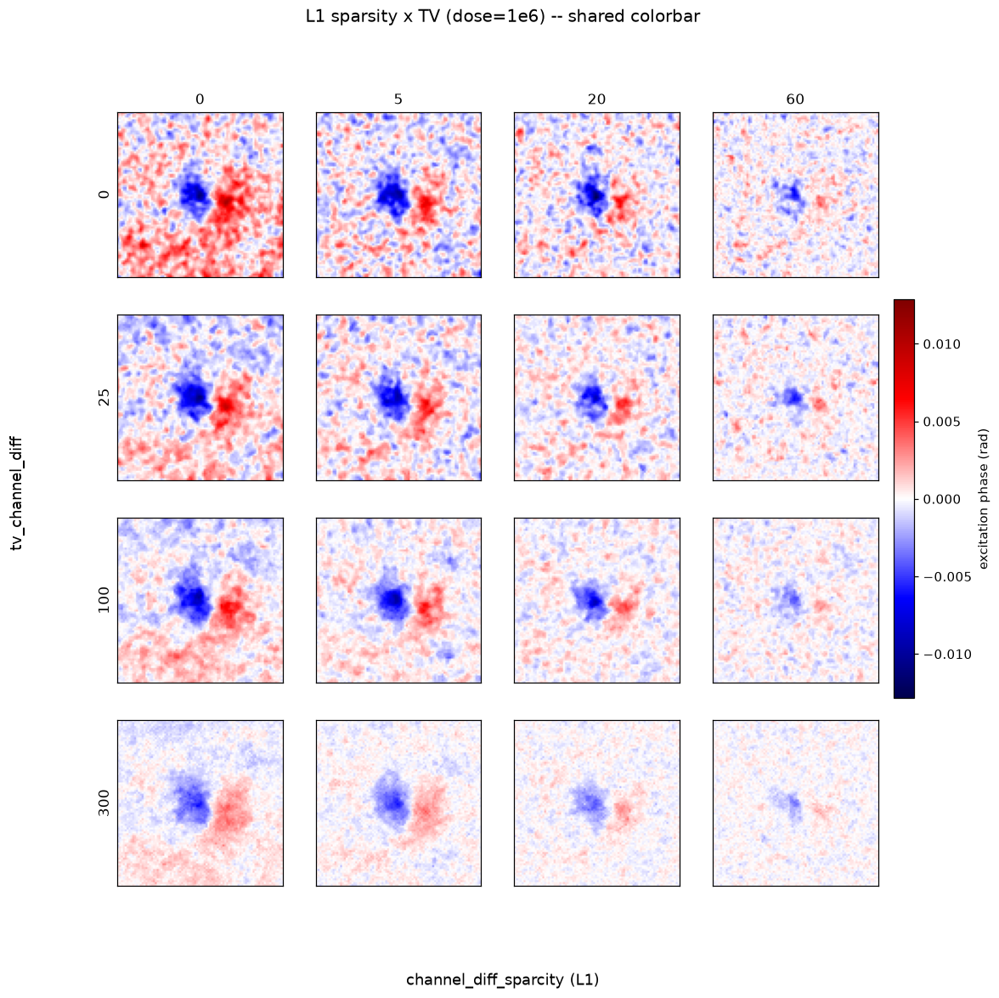

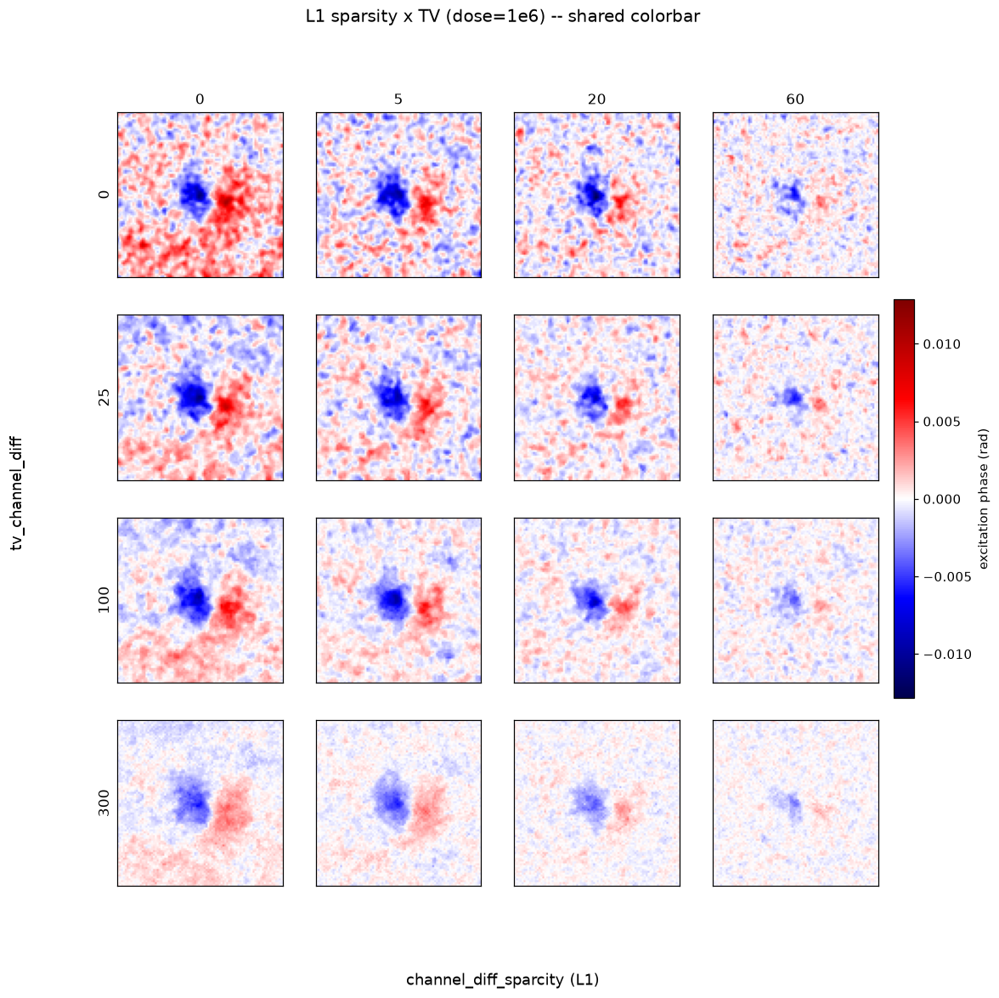

In [7]:
plot_regularization_grid(
    l1_results, TV_VALUES, L1_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_sparcity (L1)',
    shared_cbar=True,
    suptitle=f'L1 sparsity x TV (dose={dose_tag(MAIN_SWEEP_DOSE)}) -- shared colorbar',
    savepath=f"{RESULTS_DIR}/l1_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}_shared_cbar.png",
)

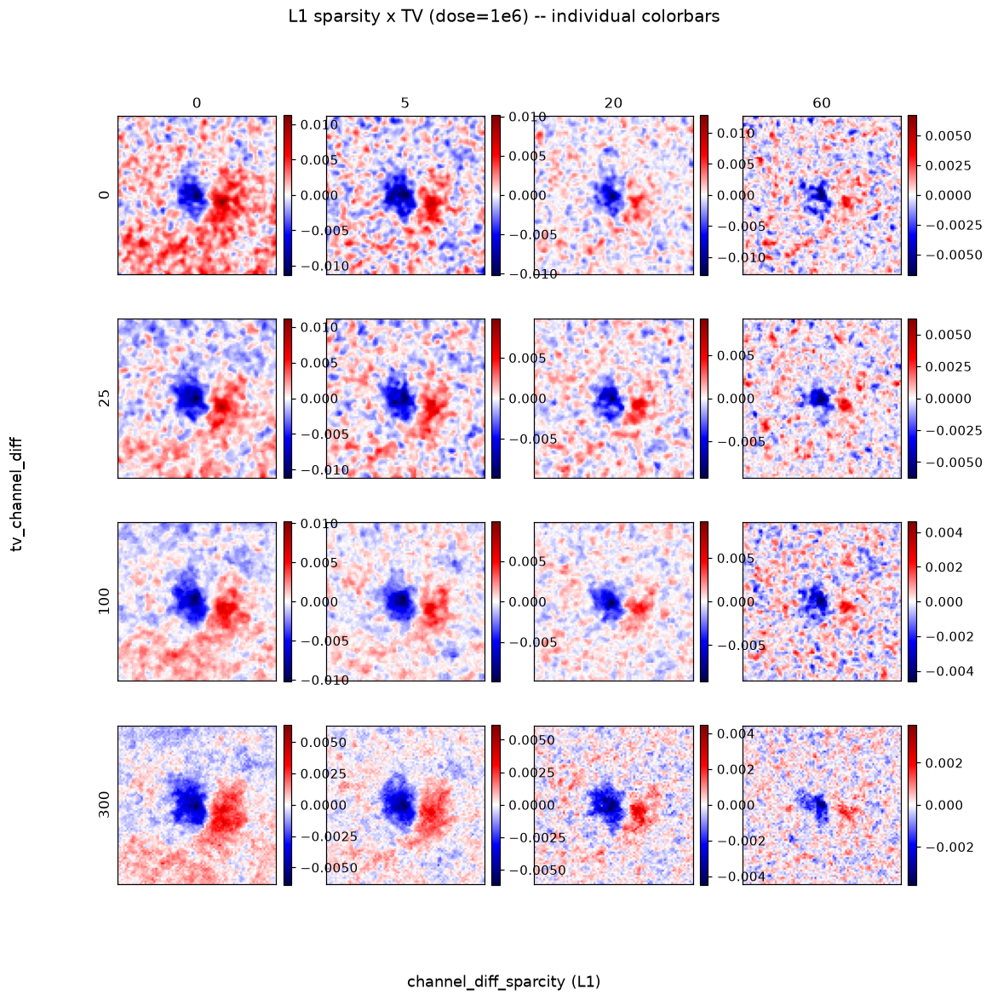

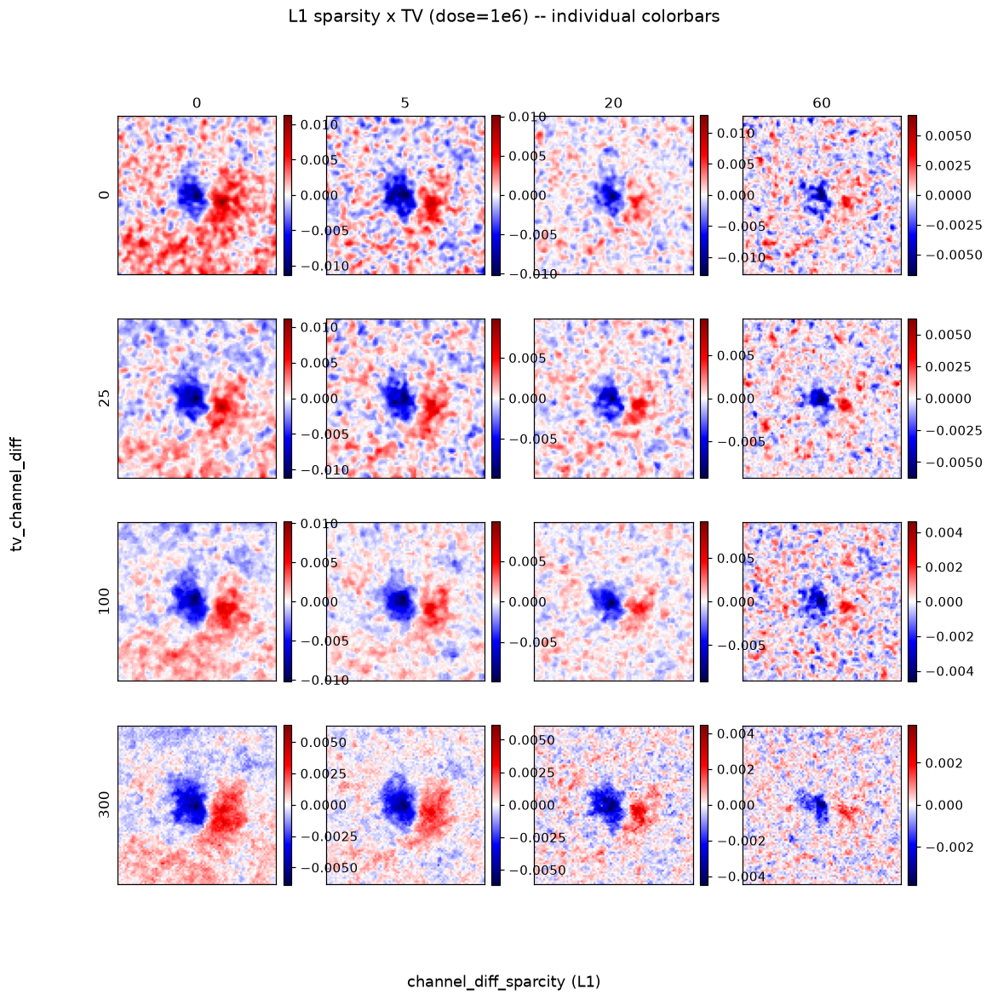

In [8]:
plot_regularization_grid(
    l1_results, TV_VALUES, L1_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_sparcity (L1)',
    shared_cbar=False,
    suptitle=f'L1 sparsity x TV (dose={dose_tag(MAIN_SWEEP_DOSE)}) -- individual colorbars',
    savepath=f"{RESULTS_DIR}/l1_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}_individual_cbar.png",
)

## Part 2 - grouped sparsity

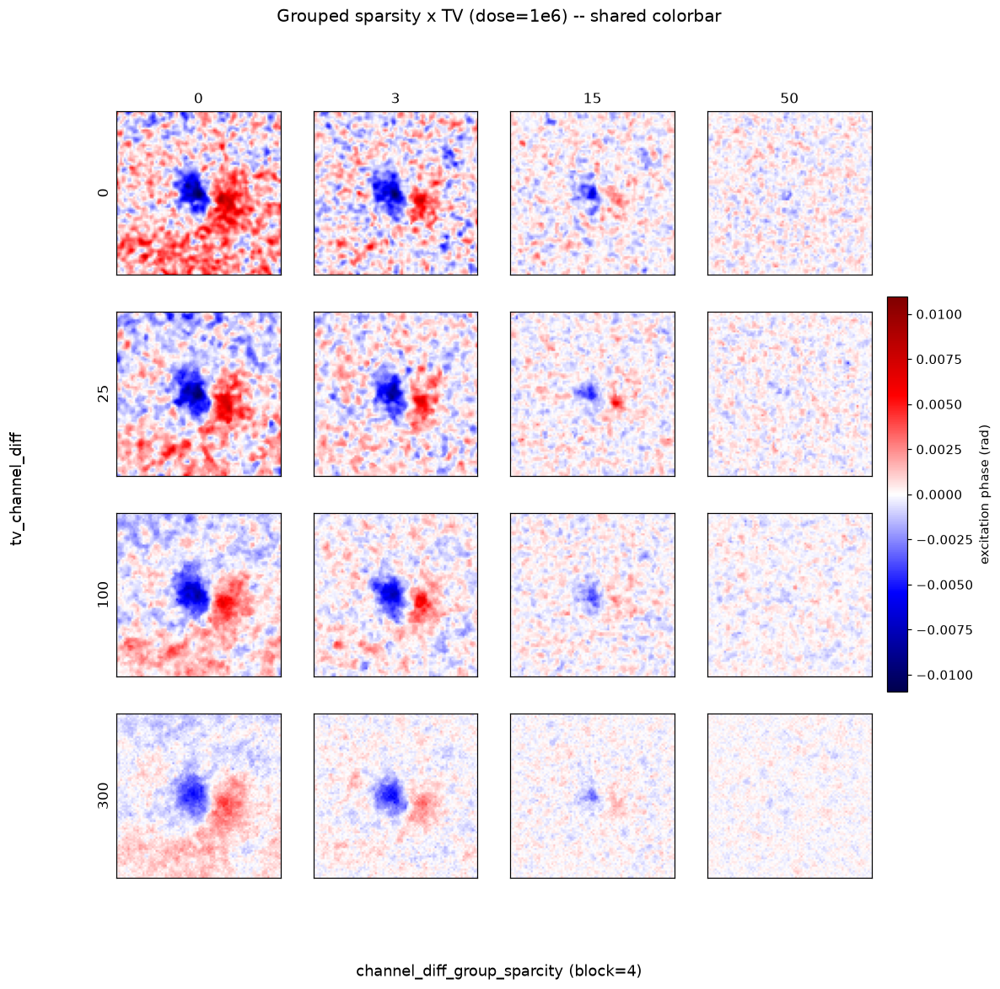

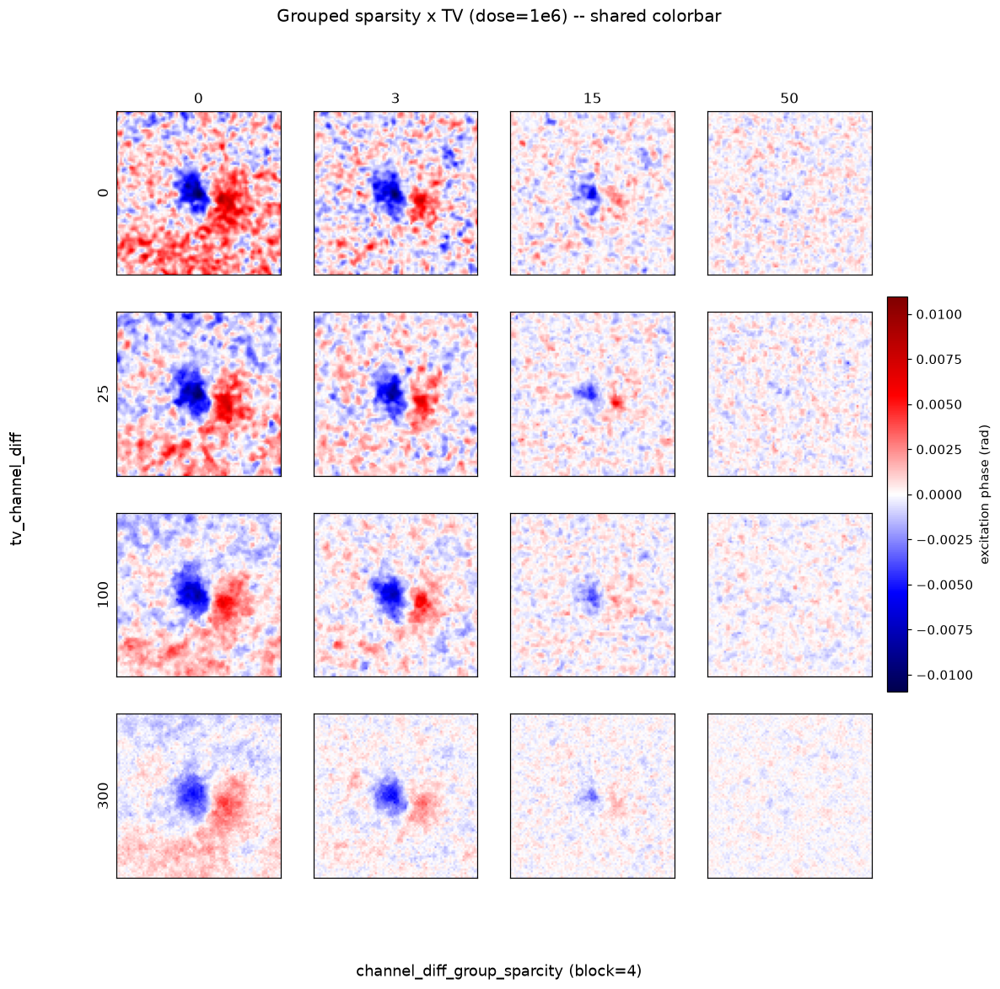

In [9]:
plot_regularization_grid(
    group_results, TV_VALUES, GROUP_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_group_sparcity (block=4)',
    shared_cbar=True,
    suptitle=f'Grouped sparsity x TV (dose={dose_tag(MAIN_SWEEP_DOSE)}) -- shared colorbar',
    savepath=f"{RESULTS_DIR}/group_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}_shared_cbar.png",
)

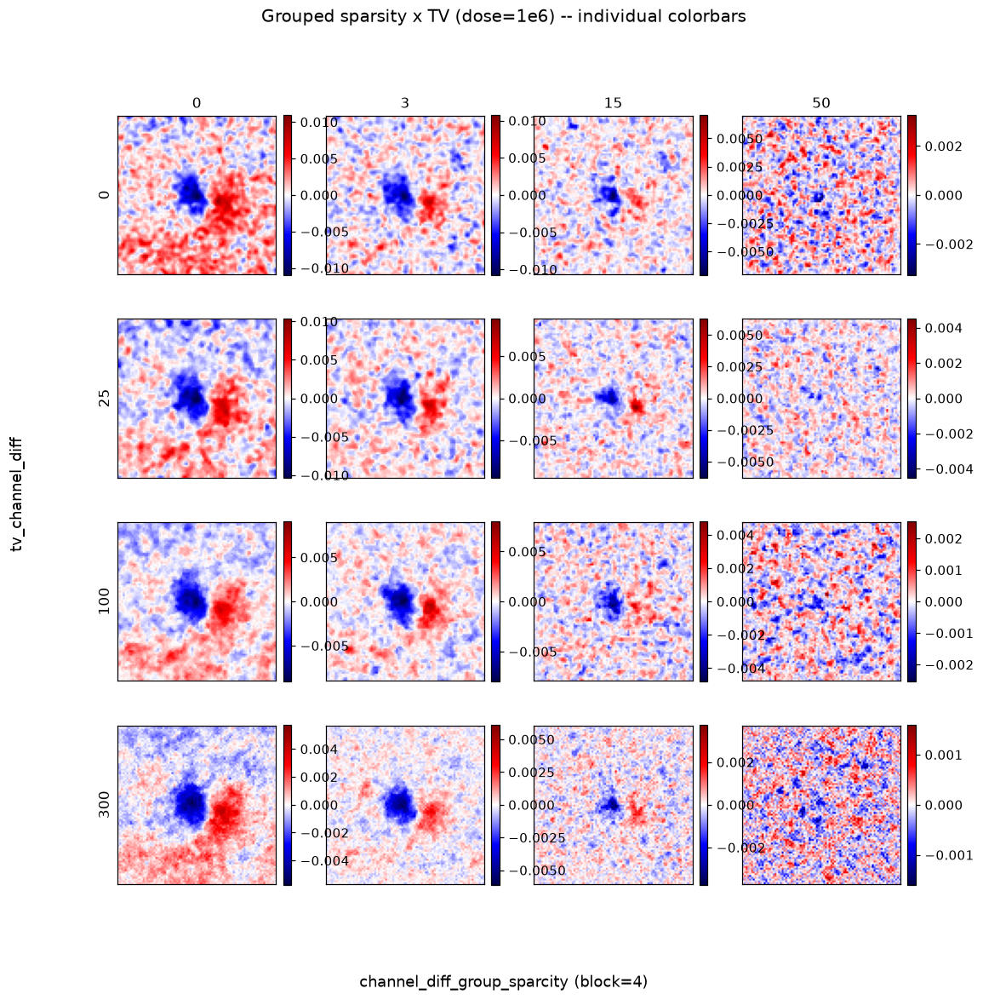

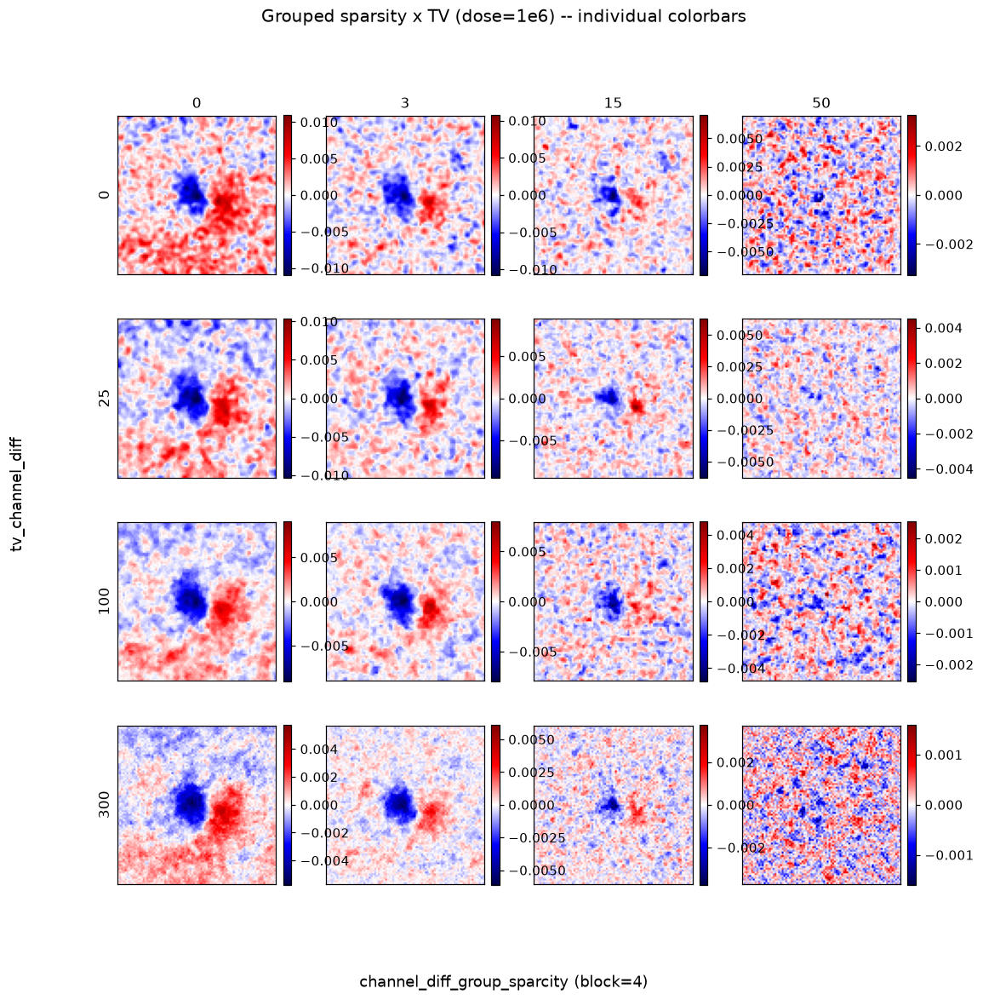

In [10]:
plot_regularization_grid(
    group_results, TV_VALUES, GROUP_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_group_sparcity (block=4)',
    shared_cbar=False,
    suptitle=f'Grouped sparsity x TV (dose={dose_tag(MAIN_SWEEP_DOSE)}) -- individual colorbars',
    savepath=f"{RESULTS_DIR}/group_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}_individual_cbar.png",
)

### 2a. Does block size matter?

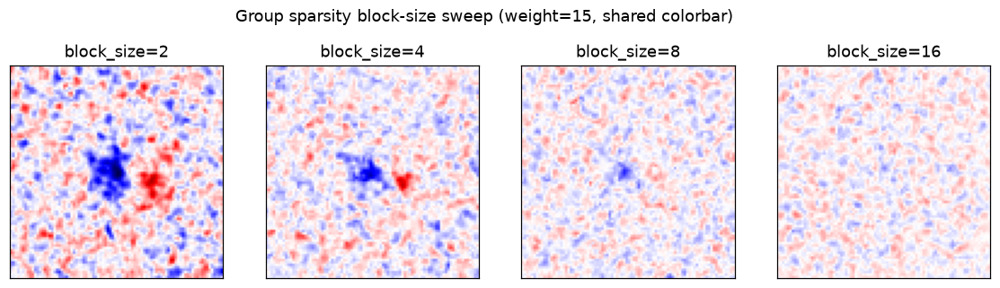

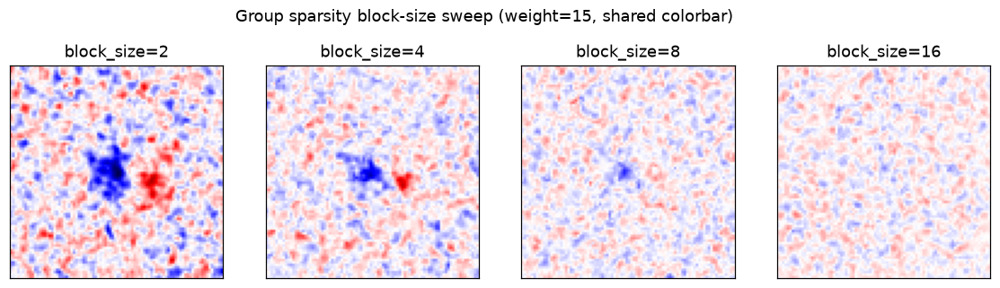

In [11]:
plot_block_size_sweep(
    block_results, BLOCK_SIZES, FIXED_GROUP_WEIGHT,
    savepath=f"{RESULTS_DIR}/group_block_size_sweep_dose{dose_tag(MAIN_SWEEP_DOSE)}.png",
)

## Part 3 - disk-correlation "hot" maps, across doses

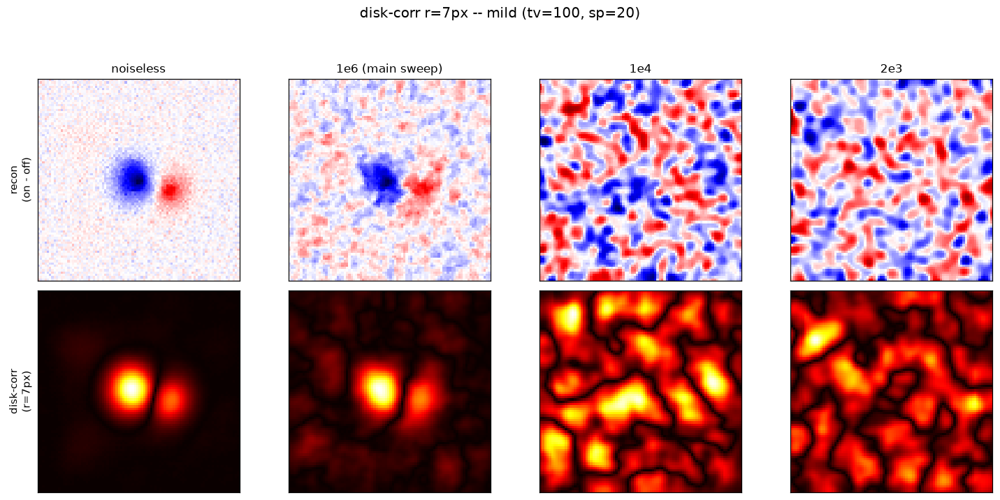

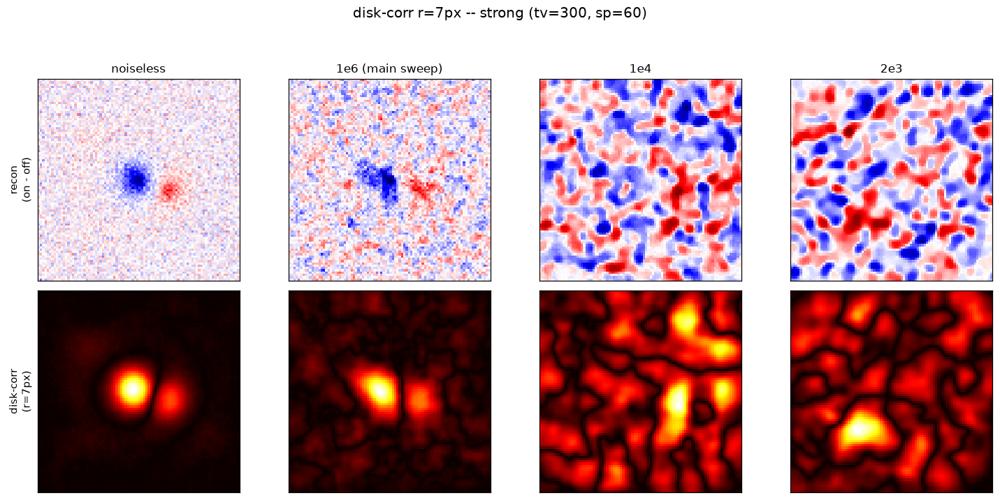

In [12]:
order = ['noiseless', f'{dose_tag(MAIN_SWEEP_DOSE)} (main sweep)', '1e4', '2e3']

for pick_label in REG_PICKS:
    entries = [(k, dose_diffs[pick_label][k]) for k in order]
    fname = pick_label.split()[0]
    plot_dose_series(entries, rad=7, suptitle=f"disk-corr r=7px -- {pick_label}", savepath=f"{RESULTS_DIR}/hot_disk_dose{dose_tag(MAIN_SWEEP_DOSE)}_r7_{fname}.png")

"Maybe even larger" -- repeating the strong-regularization row with a bigger disk radius:

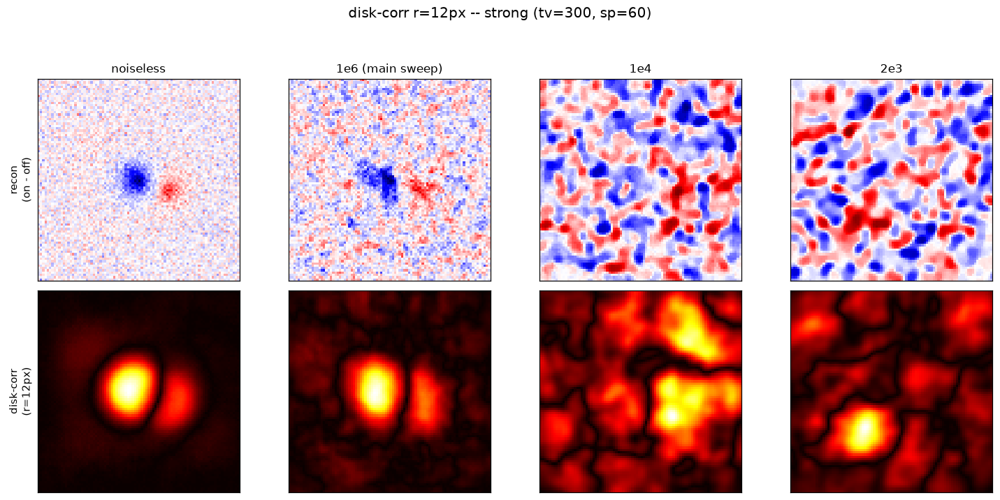

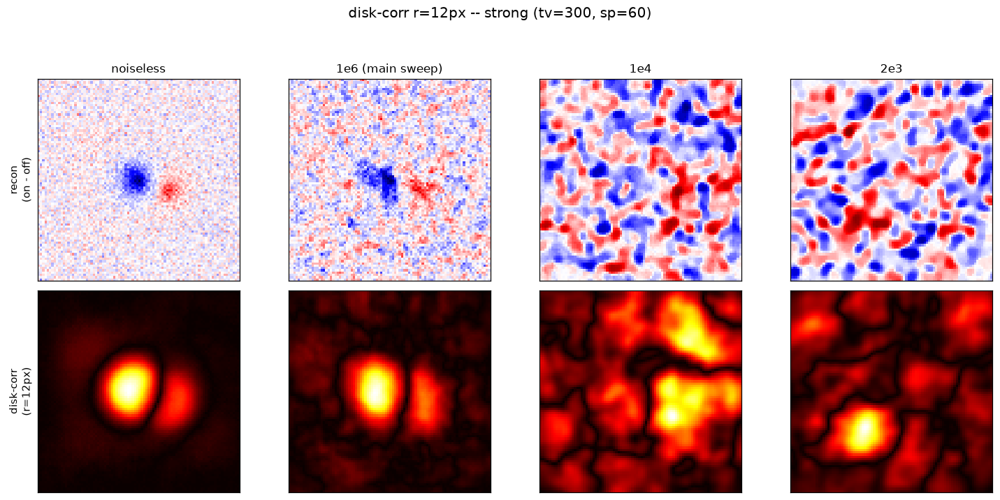

In [13]:
entries_strong = [(k, dose_diffs['strong (tv=300, sp=60)'][k]) for k in order]
plot_dose_series(entries_strong, rad=12, suptitle="disk-corr r=12px -- strong (tv=300, sp=60)", savepath=f"{RESULTS_DIR}/hot_disk_dose{dose_tag(MAIN_SWEEP_DOSE)}_r12_strong.png")

## Part 4 - disk-correlation hot maps for every swept regularization

### 4a. L1 sparsity x TV -- hot maps

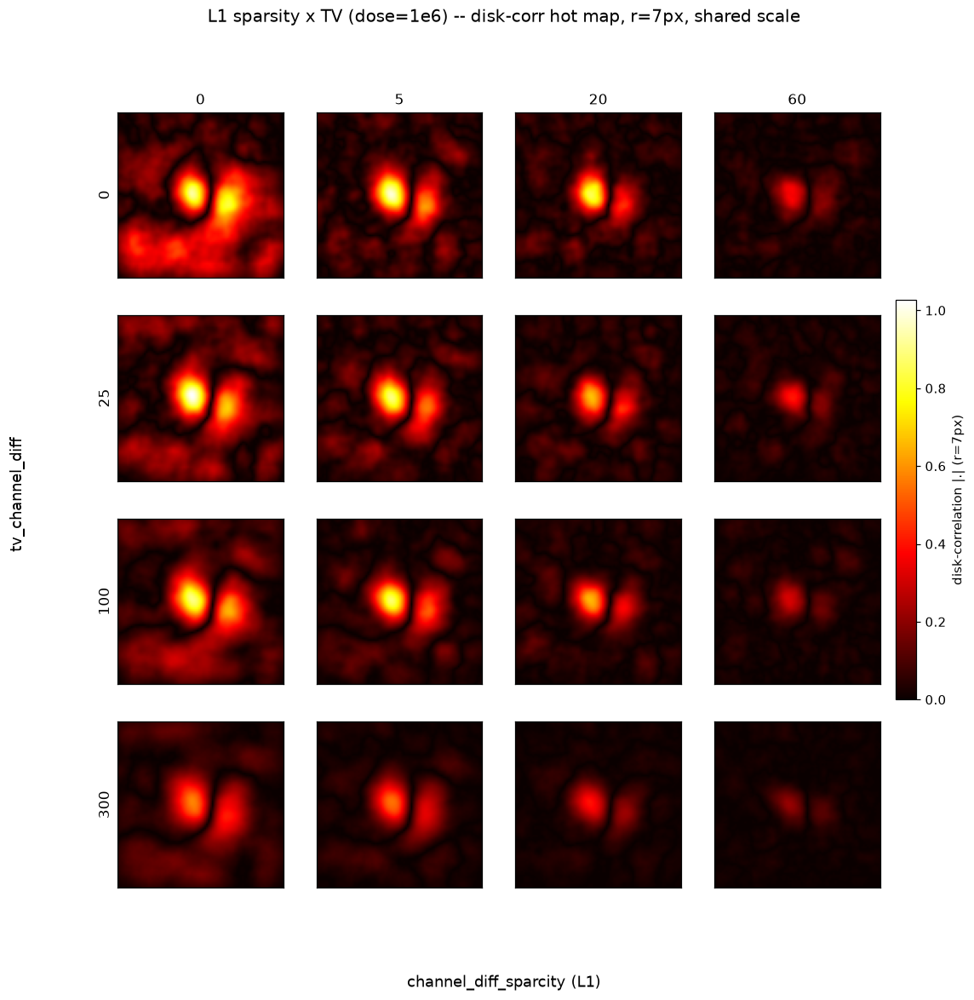

(<Figure size 1210x1188 with 17 Axes>,
 {(0.0,
   0.0): array([[0.00724411, 0.01602722, 0.02228784, ..., 0.03535127, 0.02109166,
          0.0061575 ],
         [0.01840044, 0.02846878, 0.0325749 , ..., 0.03335459, 0.01871558,
          0.00330352],
         [0.02071871, 0.02804998, 0.02986035, ..., 0.03409402, 0.01825829,
          0.00098165],
         ...,
         [0.03476604, 0.05408026, 0.07225453, ..., 0.0614943 , 0.03409934,
          0.01045601],
         [0.02061685, 0.03506982, 0.05016402, ..., 0.04643392, 0.02318176,
          0.00300483],
         [0.01354721, 0.02363297, 0.03658742, ..., 0.03224155, 0.01252717,
          0.00485667]], shape=(88, 88)),
  (0.0,
   5.0): array([[0.0696504 , 0.07916065, 0.08410011, ..., 0.02667606, 0.0150572 ,
          0.00742598],
         [0.07464506, 0.08542364, 0.0909039 , ..., 0.02548615, 0.01270675,
          0.0024008 ],
         [0.07757131, 0.08959907, 0.09437622, ..., 0.02070605, 0.00642409,
          0.00571334],
         ...,
   

In [14]:
plot_hot_grid(
    l1_results, TV_VALUES, L1_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_sparcity (L1)',
    rad=7, shared_scale=True,
    suptitle=f'L1 sparsity x TV (dose={dose_tag(MAIN_SWEEP_DOSE)}) -- disk-corr hot map, r=7px, shared scale',
    savepath=f"{RESULTS_DIR}/l1_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}_hot_shared.png",
)

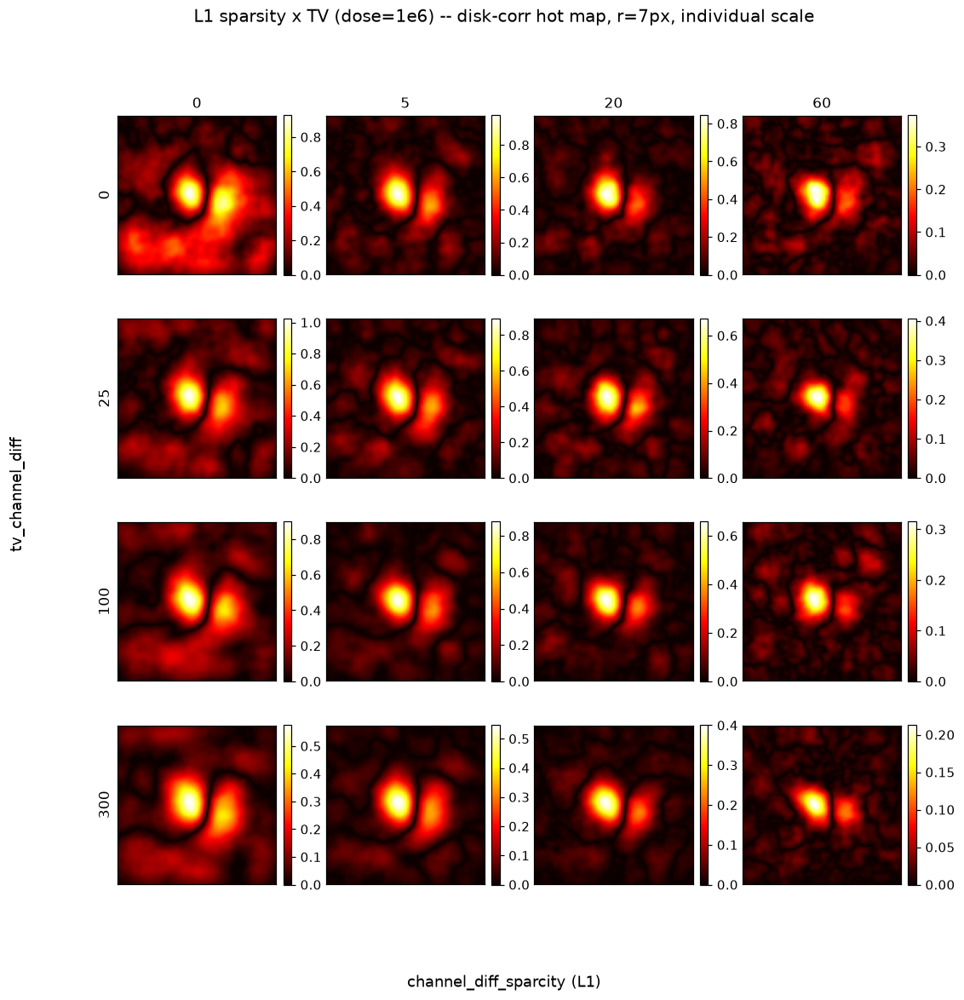

(<Figure size 1210x1188 with 32 Axes>,
 {(0.0,
   0.0): array([[0.00724411, 0.01602722, 0.02228784, ..., 0.03535127, 0.02109166,
          0.0061575 ],
         [0.01840044, 0.02846878, 0.0325749 , ..., 0.03335459, 0.01871558,
          0.00330352],
         [0.02071871, 0.02804998, 0.02986035, ..., 0.03409402, 0.01825829,
          0.00098165],
         ...,
         [0.03476604, 0.05408026, 0.07225453, ..., 0.0614943 , 0.03409934,
          0.01045601],
         [0.02061685, 0.03506982, 0.05016402, ..., 0.04643392, 0.02318176,
          0.00300483],
         [0.01354721, 0.02363297, 0.03658742, ..., 0.03224155, 0.01252717,
          0.00485667]], shape=(88, 88)),
  (0.0,
   5.0): array([[0.0696504 , 0.07916065, 0.08410011, ..., 0.02667606, 0.0150572 ,
          0.00742598],
         [0.07464506, 0.08542364, 0.0909039 , ..., 0.02548615, 0.01270675,
          0.0024008 ],
         [0.07757131, 0.08959907, 0.09437622, ..., 0.02070605, 0.00642409,
          0.00571334],
         ...,
   

In [15]:
plot_hot_grid(
    l1_results, TV_VALUES, L1_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label='channel_diff_sparcity (L1)',
    rad=7, shared_scale=False,
    suptitle=f'L1 sparsity x TV (dose={dose_tag(MAIN_SWEEP_DOSE)}) -- disk-corr hot map, r=7px, individual scale',
    savepath=f"{RESULTS_DIR}/l1_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}_hot_individual.png",
)

### 4b. Grouped sparsity x TV -- hot maps

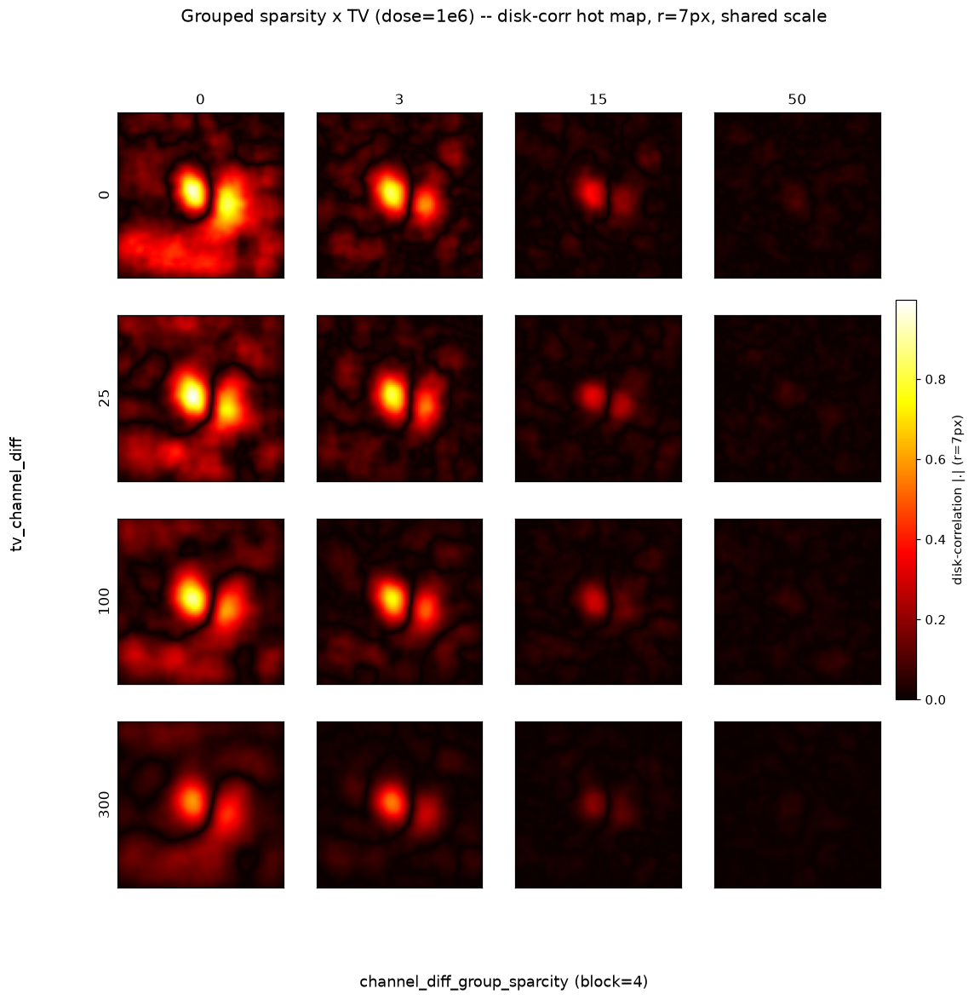

(<Figure size 1210x1188 with 17 Axes>,
 {(0.0,
   0.0): array([[0.02638554, 0.03105896, 0.03000633, ..., 0.02719427, 0.02271626,
          0.01180253],
         [0.03171248, 0.036626  , 0.03739195, ..., 0.01409303, 0.01111258,
          0.00229379],
         [0.03386904, 0.03980338, 0.0432967 , ..., 0.00643329, 0.00180525,
          0.00854418],
         ...,
         [0.05173244, 0.06929761, 0.07954826, ..., 0.04449759, 0.01890047,
          0.00387537],
         [0.0363112 , 0.05307784, 0.0645252 , ..., 0.03231546, 0.01103532,
          0.00649837],
         [0.02731769, 0.04036687, 0.05250379, ..., 0.0224506 , 0.00578591,
          0.00692837]], shape=(88, 88)),
  (0.0,
   3.0): array([[0.02145567, 0.02765353, 0.03340811, ..., 0.04844767, 0.04581291,
          0.03441681],
         [0.02550365, 0.03628313, 0.0446074 , ..., 0.04084905, 0.04113199,
          0.03369219],
         [0.03380742, 0.04794302, 0.05704979, ..., 0.03178155, 0.03214104,
          0.02590147],
         ...,
   

In [16]:
plot_hot_grid(
    group_results, TV_VALUES, GROUP_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label=f'channel_diff_group_sparcity (block={GROUP_BLOCK_SIZE})',
    rad=7, shared_scale=True,
    suptitle=f'Grouped sparsity x TV (dose={dose_tag(MAIN_SWEEP_DOSE)}) -- disk-corr hot map, r=7px, shared scale',
    savepath=f"{RESULTS_DIR}/group_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}_hot_shared.png",
)

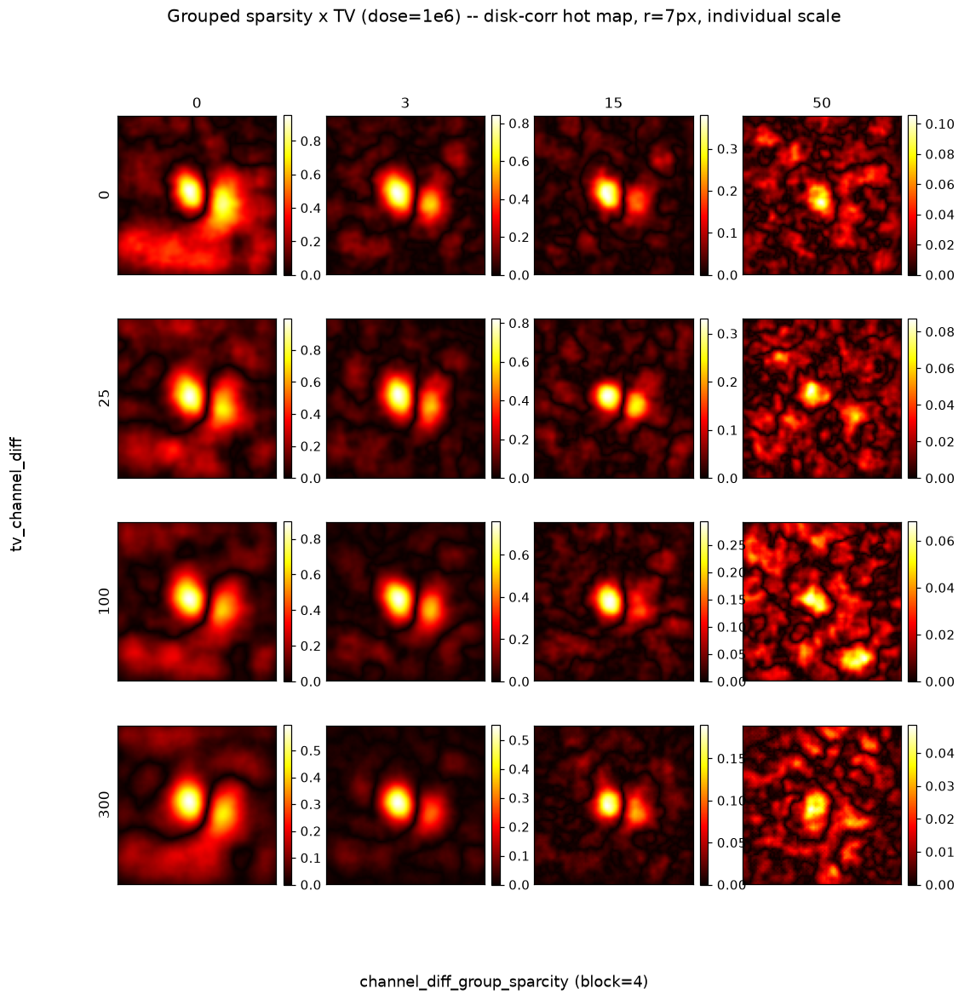

(<Figure size 1210x1188 with 32 Axes>,
 {(0.0,
   0.0): array([[0.02638554, 0.03105896, 0.03000633, ..., 0.02719427, 0.02271626,
          0.01180253],
         [0.03171248, 0.036626  , 0.03739195, ..., 0.01409303, 0.01111258,
          0.00229379],
         [0.03386904, 0.03980338, 0.0432967 , ..., 0.00643329, 0.00180525,
          0.00854418],
         ...,
         [0.05173244, 0.06929761, 0.07954826, ..., 0.04449759, 0.01890047,
          0.00387537],
         [0.0363112 , 0.05307784, 0.0645252 , ..., 0.03231546, 0.01103532,
          0.00649837],
         [0.02731769, 0.04036687, 0.05250379, ..., 0.0224506 , 0.00578591,
          0.00692837]], shape=(88, 88)),
  (0.0,
   3.0): array([[0.02145567, 0.02765353, 0.03340811, ..., 0.04844767, 0.04581291,
          0.03441681],
         [0.02550365, 0.03628313, 0.0446074 , ..., 0.04084905, 0.04113199,
          0.03369219],
         [0.03380742, 0.04794302, 0.05704979, ..., 0.03178155, 0.03214104,
          0.02590147],
         ...,
   

In [17]:
plot_hot_grid(
    group_results, TV_VALUES, GROUP_SPARSITY_VALUES,
    row_label='tv_channel_diff', col_label=f'channel_diff_group_sparcity (block={GROUP_BLOCK_SIZE})',
    rad=7, shared_scale=False,
    suptitle=f'Grouped sparsity x TV (dose={dose_tag(MAIN_SWEEP_DOSE)}) -- disk-corr hot map, r=7px, individual scale',
    savepath=f"{RESULTS_DIR}/group_grid_dose{dose_tag(MAIN_SWEEP_DOSE)}_hot_individual.png",
)

## Part 5 - window-size (disk radius) sweep, 5-30px

### 5a. Montages: hot map vs. window size, across doses

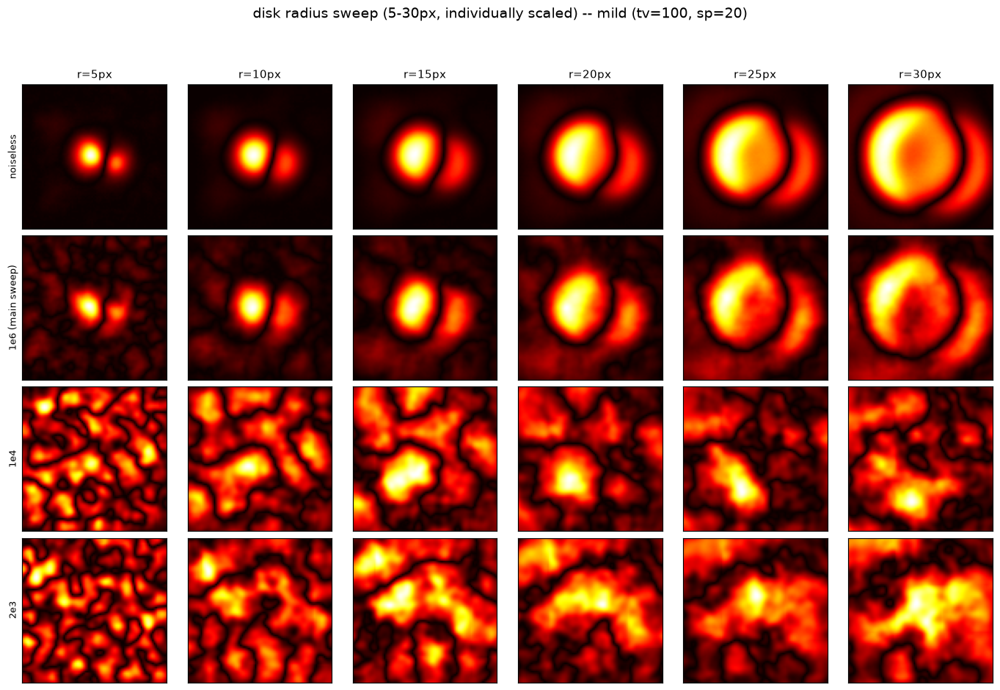

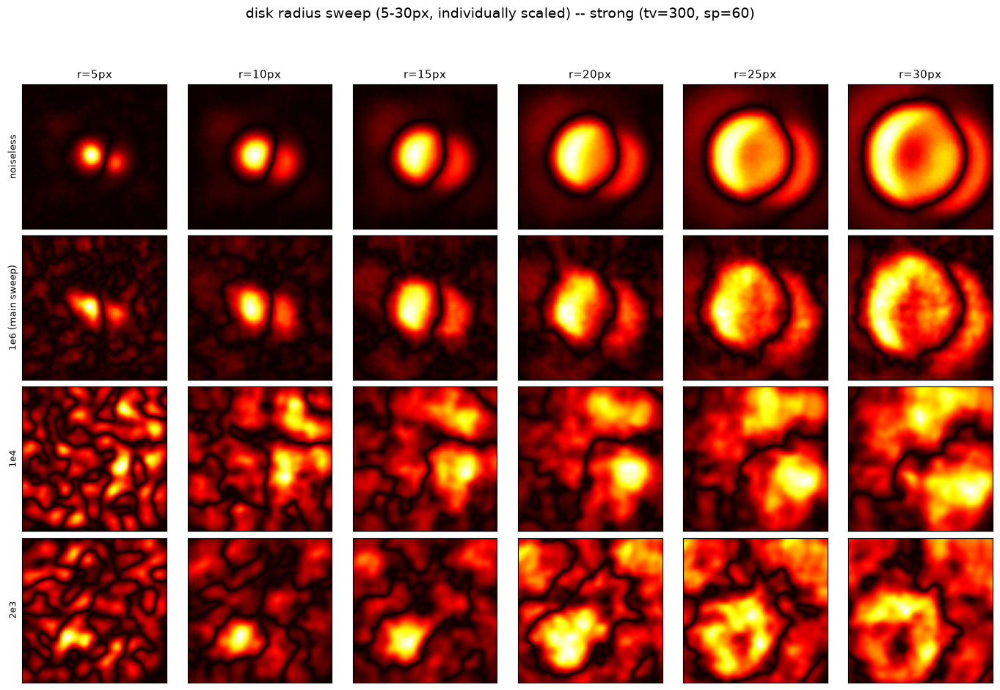

In [18]:
RADII_COARSE = list(range(5, 31, 5))   # montage columns: 5,10,15,20,25,30
RADII_FINE = list(range(5, 31, 1))     # peakiness curves, 1px steps

for pick_label in REG_PICKS:
    entries = [(k, dose_diffs[pick_label][k]) for k in order]
    fname = pick_label.split()[0]
    plot_radius_montage(
        entries, RADII_COARSE,
        suptitle=f"disk radius sweep (5-30px, individually scaled) -- {pick_label}",
        savepath=f"{RESULTS_DIR}/radius_sweep_dose{dose_tag(MAIN_SWEEP_DOSE)}_{fname}.png",
    )

### 5b. Quantitative sweep: peakiness vs. radius, all 32 grid cells vs. noiseless reference

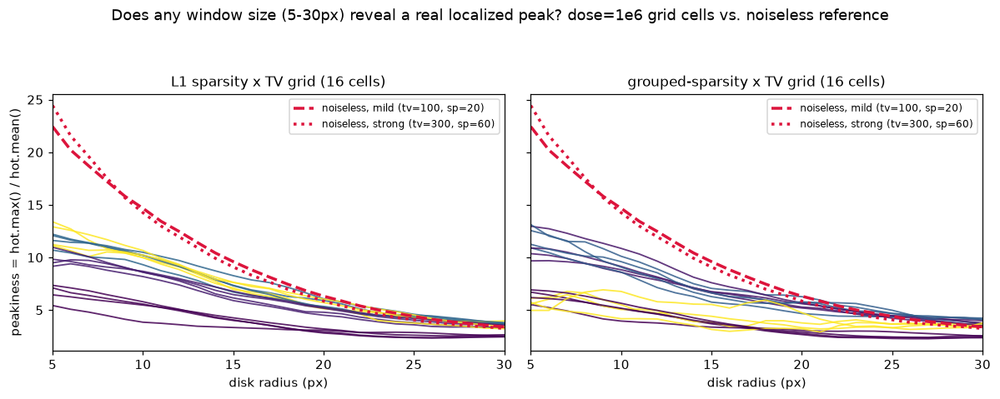

In [19]:
def peakiness_curve(diff, radii):
    return [peakiness(hot_correlation(diff, r)) for r in radii]


l1_peakiness = {k: peakiness_curve(v, RADII_FINE) for k, v in l1_results.items()}
group_peakiness = {k: peakiness_curve(v, RADII_FINE) for k, v in group_results.items()}
noiseless_peakiness = {pick: peakiness_curve(dose_diffs[pick]['noiseless'], RADII_FINE) for pick in REG_PICKS}

fig, axes = plt.subplots(1, 2, figsize=(11, 4.4), dpi=110, sharey=True)
cmap = plt.get_cmap('viridis')

for ax, results, values, peak_dict, title in [
    (axes[0], l1_results, L1_SPARSITY_VALUES, l1_peakiness, 'L1 sparsity x TV grid (16 cells)'),
    (axes[1], group_results, GROUP_SPARSITY_VALUES, group_peakiness, 'grouped-sparsity x TV grid (16 cells)'),
]:
    vmax = max(values) or 1.0
    for (tv, val), curve in peak_dict.items():
        color = cmap(val / vmax)
        ax.plot(RADII_FINE, curve, color=color, lw=1.2, alpha=0.85)
    for pick, curve in noiseless_peakiness.items():
        ls = '--' if 'mild' in pick else ':'
        ax.plot(RADII_FINE, curve, color='crimson', lw=2.3, ls=ls, label=f'noiseless, {pick}')
    ax.set_xlabel('disk radius (px)')
    ax.set_title(title, fontsize=11)
    ax.legend(fontsize=8, loc='upper right')
    ax.set_xlim(RADII_FINE[0], RADII_FINE[-1])

axes[0].set_ylabel('peakiness = hot.max() / hot.mean()')
fig.suptitle(
    f'Does any window size (5-30px) reveal a real localized peak? dose={dose_tag(MAIN_SWEEP_DOSE)} grid cells vs. noiseless reference',
    fontsize=12,
)
fig.tight_layout(rect=[0, 0, 1, 0.92])
fig.savefig(f"{RESULTS_DIR}/radius_sweep_dose{dose_tag(MAIN_SWEEP_DOSE)}_peakiness.png", bbox_inches='tight')
plt.show()

with open(f"{RESULTS_DIR}/radius_sweep_dose{dose_tag(MAIN_SWEEP_DOSE)}_results.pkl", "wb") as f:
    pickle.dump({
        "radii_coarse": RADII_COARSE,
        "radii_fine": RADII_FINE,
        "l1_peakiness": l1_peakiness,
        "group_peakiness": group_peakiness,
        "noiseless_peakiness": noiseless_peakiness,
    }, f)

## Summary

Every figure above comes straight from the four pickles `03.7a` writes -- no reconstruction
happens in this notebook, so re-running it end to end after tweaking a colormap, a disk
radius, or the montage layout takes a few seconds, not the better part of a GPU-day.